# Import Libraries

In [111]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load Dataset

In [2]:
data = pd.read_csv("Walmart.csv")
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


# Data Preprocessing

In [3]:
data.isna().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [4]:
data.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [6]:
data.dtypes

Store             int64
Date             object
Weekly_Sales    float64
Holiday_Flag      int64
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
dtype: object

In [7]:
data.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


In [8]:
data.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

In [9]:
data.corr

<bound method DataFrame.corr of       Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0         1  05-02-2010    1643690.90             0        42.31       2.572   
1         1  12-02-2010    1641957.44             1        38.51       2.548   
2         1  19-02-2010    1611968.17             0        39.93       2.514   
3         1  26-02-2010    1409727.59             0        46.63       2.561   
4         1  05-03-2010    1554806.68             0        46.50       2.625   
...     ...         ...           ...           ...          ...         ...   
6430     45  28-09-2012     713173.95             0        64.88       3.997   
6431     45  05-10-2012     733455.07             0        64.89       3.985   
6432     45  12-10-2012     734464.36             0        54.47       4.000   
6433     45  19-10-2012     718125.53             0        56.47       3.969   
6434     45  26-10-2012     760281.43             0        58.85       3.882   

       

In [10]:
df = pd.DataFrame(data)
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [11]:
# Convert date to datetime
df['Date'] = pd.to_datetime(df['Date'], format="%d-%m-%Y")

# Sort by date
df = df.sort_values('Date')

# Feature Engineering
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['week'] = df['Date'].dt.isocalendar().week
df['day'] = df['Date'].dt.day
df['dayofweek'] = df['Date'].dt.dayofweek
df['is_weekend'] = df['dayofweek'].isin([5,6]).astype(int)

In [12]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week,day,dayofweek,is_weekend
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5,5,4,0
1287,10,2010-02-05,2193048.75,0,54.34,2.962,126.442065,9.765,2010,2,5,5,4,0
5148,37,2010-02-05,536006.73,0,45.97,2.572,209.852966,8.554,2010,2,5,5,4,0
2288,17,2010-02-05,789036.02,0,23.11,2.666,126.442065,6.548,2010,2,5,5,4,0
4147,30,2010-02-05,465108.52,0,39.05,2.572,210.752605,8.324,2010,2,5,5,4,0


In [13]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'year', 'month', 'week', 'day',
       'dayofweek', 'is_weekend'],
      dtype='object')

# Exploratory Data Analysis (EDA)

In [118]:
import plotly.express as px
import plotly.graph_objects as go

# Overall Sales Trend

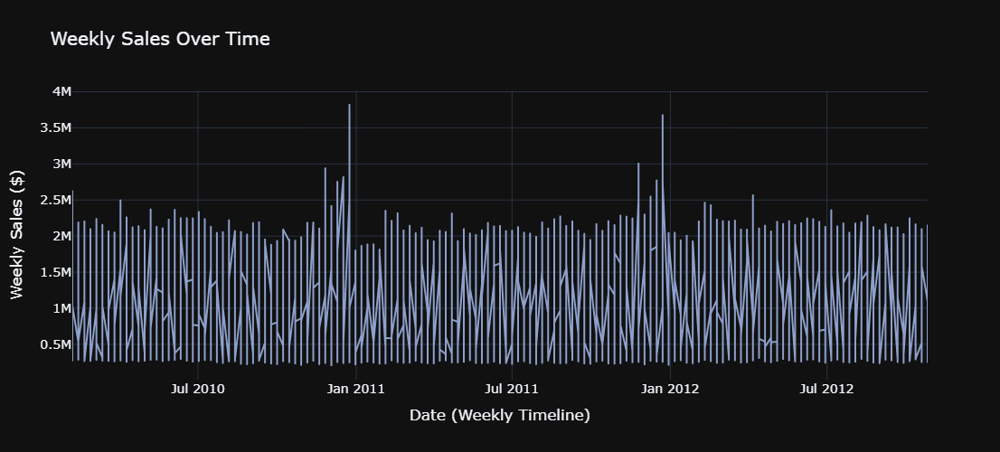

In [120]:
fig = px.line(df, x="Date", y="Weekly_Sales", title="Weekly Sales Over Time", 
              template="plotly_dark", width=1100, height=500,
             color_discrete_sequence=[px.colors.qualitative.Set2[2]])

fig.update_layout(
    xaxis_title="Date (Weekly Timeline)",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Holiday vs Non-Holiday Sales

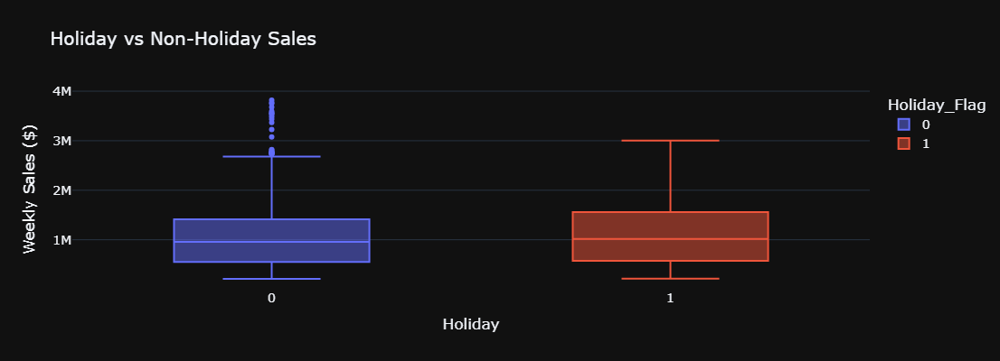

In [93]:
fig = px.box(df, x="Holiday_Flag", y="Weekly_Sales", title="Holiday vs Non-Holiday Sales", template="plotly_dark",
             width=1100, height=400, color='Holiday_Flag')

fig.update_layout(
    xaxis_title="Holiday",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Yearly and Monthly Trends

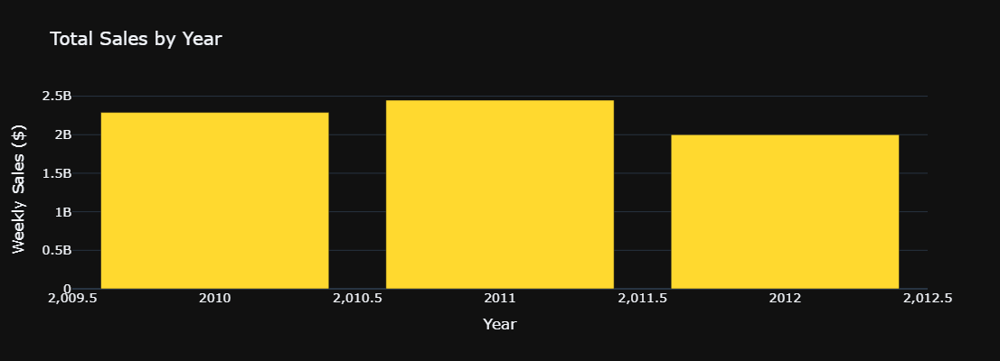

In [131]:
# Yearly trend
yearly = df.groupby("year", as_index=False)['Weekly_Sales'].sum()
fig = px.bar(yearly, x="year", y="Weekly_Sales", title="Total Sales by Year", template="plotly_dark", 
             color_discrete_sequence=[px.colors.qualitative.Set2[5]], width=1100, height=400)

fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Monthly average sales

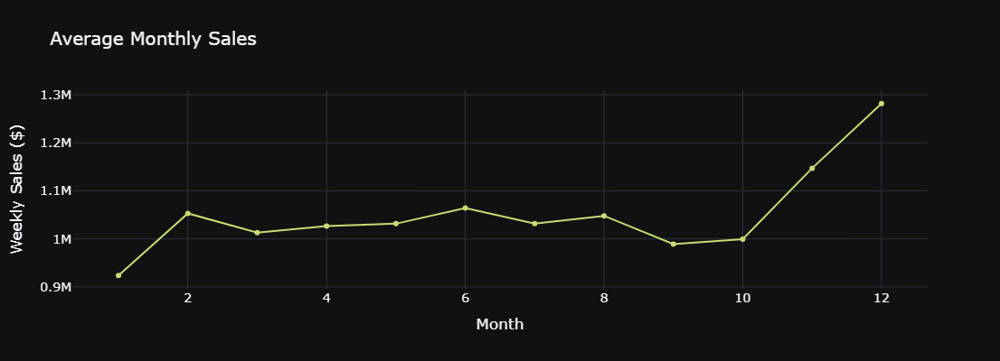

In [139]:
monthly = df.groupby("month", as_index=False)['Weekly_Sales'].mean()
fig = px.line(monthly, x="month", y="Weekly_Sales", markers=True, title="Average Monthly Sales", 
              template="plotly_dark", width=1100, height=400, color_discrete_sequence=[px.colors.qualitative.Pastel[7]])

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Weekly Seasonality (Day of Week)

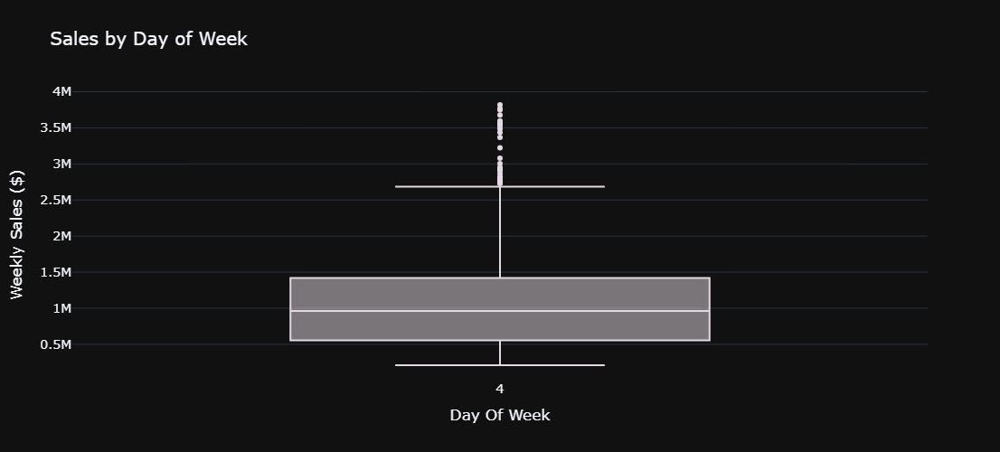

In [164]:
fig = px.box(df, x="dayofweek", y="Weekly_Sales", color_discrete_sequence=px.colors.cyclical.Twilight,
             title="Sales by Day of Week", template="plotly_dark",
             width=1100, height=500)

fig.update_layout(
    xaxis_title="Day Of Week",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Store-Level Insights

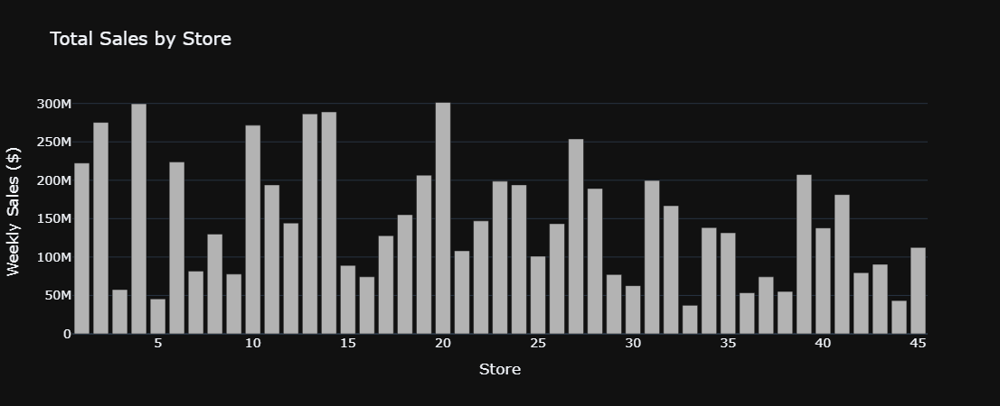

In [181]:
store_sales = df.groupby("Store", as_index=False)['Weekly_Sales'].sum()
fig = px.bar(store_sales, x="Store", y="Weekly_Sales", title="Total Sales by Store", template="plotly_dark",
             color_discrete_sequence=[px.colors.qualitative.Pastel[10]], width=1100, height=450)

fig.update_layout(
    xaxis_title="Store",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

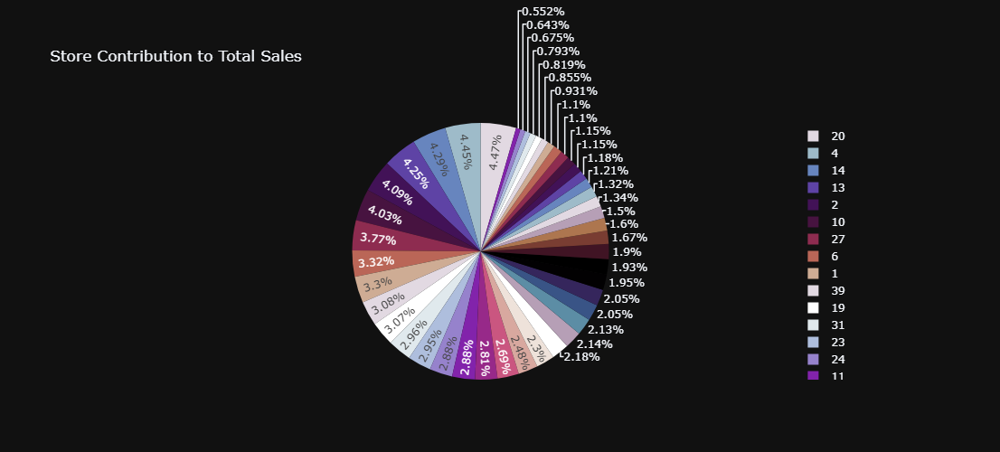

In [205]:
fig = px.pie(store_sales, names="Store", values="Weekly_Sales", title="Store Contribution to Total Sales",
             width=1100, height=500, template="plotly_dark", color_discrete_sequence=px.colors.cyclical.Twilight)

fig.show()

# Effect of External Factors

## Temperature vs Sales

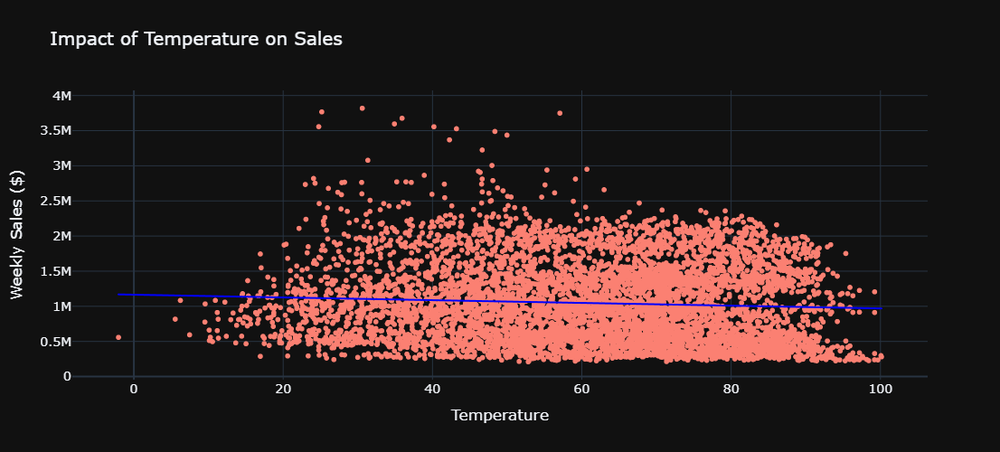

In [217]:
fig = px.scatter(df, x="Temperature", y="Weekly_Sales", trendline="ols", trendline_color_override='Blue',
                 title="Impact of Temperature on Sales", template="plotly_dark",
                 color_discrete_sequence=[px.colors.qualitative.Set3[3]], width=1100, height=500)

fig.update_layout(
    xaxis_title="Temperature",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

## Fuel Price vs Sales

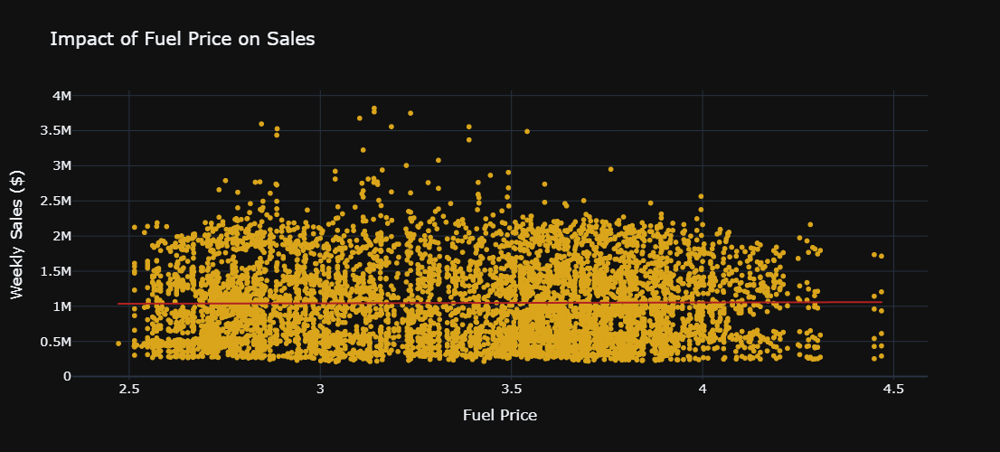

In [232]:
fig = px.scatter(df, x="Fuel_Price", y="Weekly_Sales", trendline="ols", trendline_color_override='firebrick',
                 title="Impact of Fuel Price on Sales", template="plotly_dark",
                 color_discrete_sequence=[px.colors.qualitative.Vivid[6]], width=1100, height=500)

fig.update_layout(
    xaxis_title="Fuel Price",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

## CPI vs Sales

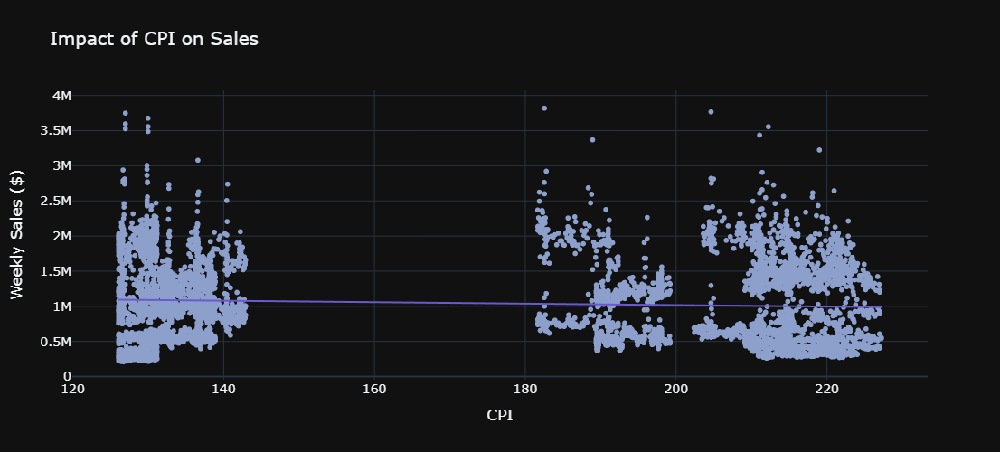

In [243]:
fig = px.scatter(df, x="CPI", y="Weekly_Sales", trendline="ols", trendline_color_override='slateblue',
                 title="Impact of CPI on Sales", template="plotly_dark",
                 color_discrete_sequence=[px.colors.qualitative.Set2[2]], width=1100, height=500)

fig.update_layout(
    xaxis_title="CPI",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

## Unemployment vs Sales

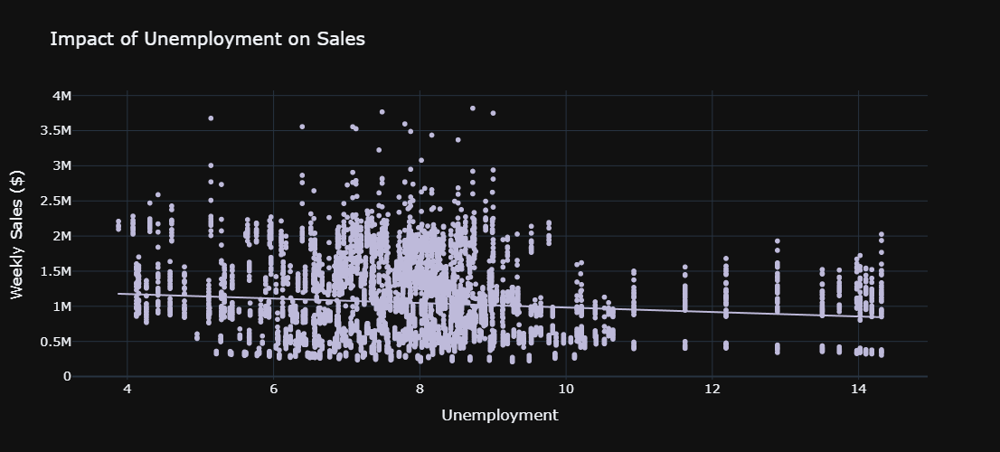

In [250]:
fig = px.scatter(df, x="Unemployment", y="Weekly_Sales", trendline="ols", 
                 title="Impact of Unemployment on Sales", template="plotly_dark",
                 color_discrete_sequence=[px.colors.qualitative.Set3[2]], width=1100, height=500)

fig.update_layout(
    xaxis_title="Unemployment",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

## Correlation Heatmap

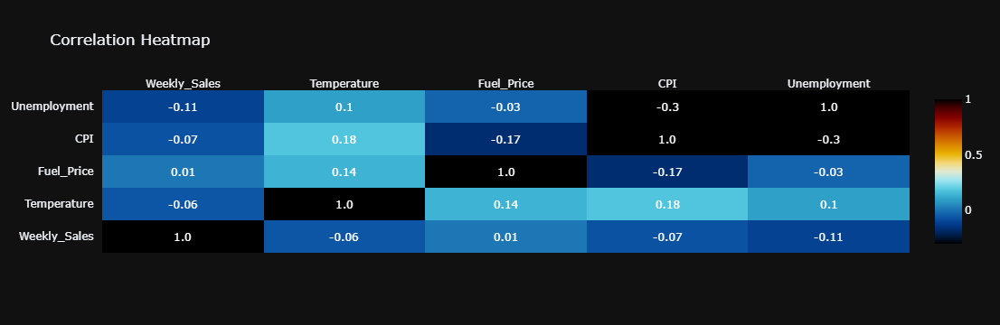

In [268]:
corr = df[['Weekly_Sales','Temperature','Fuel_Price','CPI','Unemployment']].corr()
fig = ff.create_annotated_heatmap(
    z=np.round(corr.values,2),
    x=list(corr.columns),
    y=list(corr.index),
    colorscale="Icefire", showscale=True
)
fig.update_layout(title="Correlation Heatmap", template="plotly_dark")
fig.show()

# Holiday Impact by Year

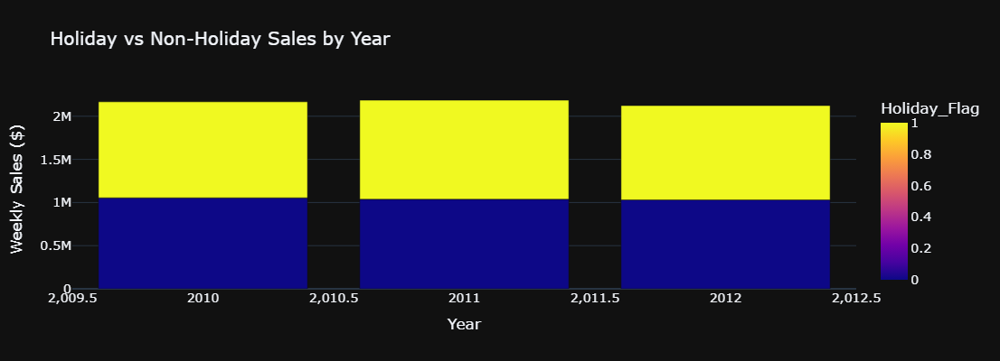

In [286]:
holiday_sales = df.groupby(["year","Holiday_Flag"])['Weekly_Sales'].mean().reset_index()
fig = px.bar(holiday_sales, x="year", y="Weekly_Sales", color="Holiday_Flag", template='plotly_dark',
             barmode="stack", title="Holiday vs Non-Holiday Sales by Year", width=1100, height=400)

fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Rolling Averages & Moving Trends

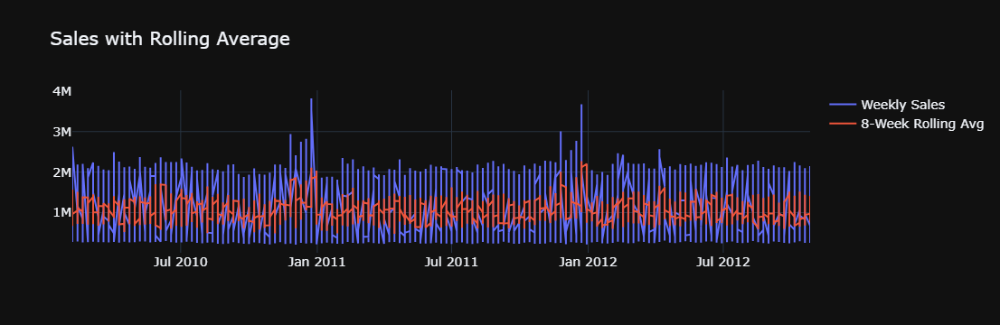

In [292]:
df['rolling_8'] = df['Weekly_Sales'].rolling(window=8).mean()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['Date'], y=df['Weekly_Sales'], mode='lines', name='Weekly Sales'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['rolling_8'], mode='lines', name='8-Week Rolling Avg'))
fig.update_layout(title="Sales with Rolling Average", template='plotly_dark', font=dict(size=14))
fig.show()

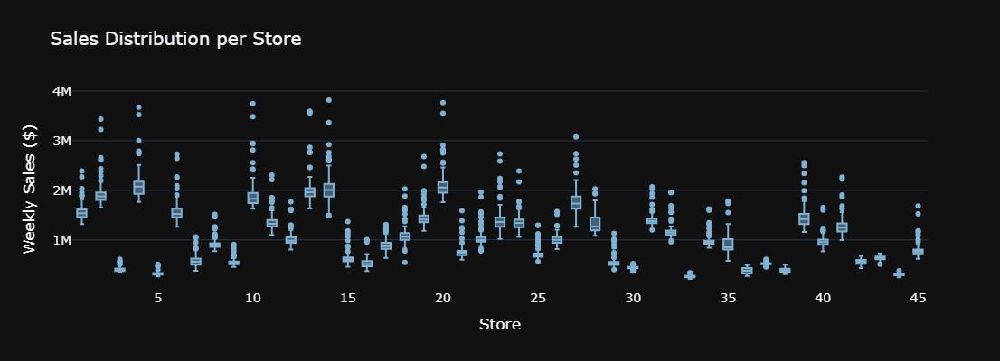

In [311]:
fig = px.box(df, x="Store", y="Weekly_Sales", title="Sales Distribution per Store", template='plotly_dark',
             color_discrete_sequence=[px.colors.qualitative.Set3[4]], width=1100, height=400)

fig.update_layout(
    xaxis_title="Store",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Top & Bottom Performing Weeks

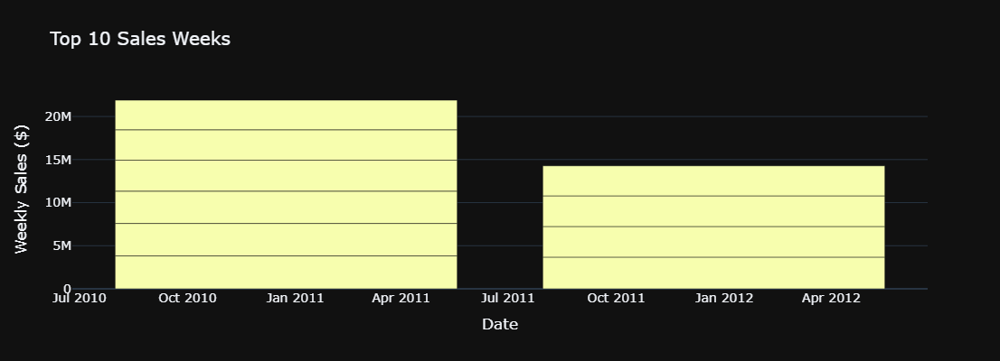

In [321]:
top_weeks = df.sort_values("Weekly_Sales", ascending=False).head(10)
fig = px.bar(top_weeks, x="Date", y="Weekly_Sales", title="Top 10 Sales Weeks", template='plotly_dark',
             color_discrete_sequence=px.colors.sequential.Bluyl, width=1100, height=400)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

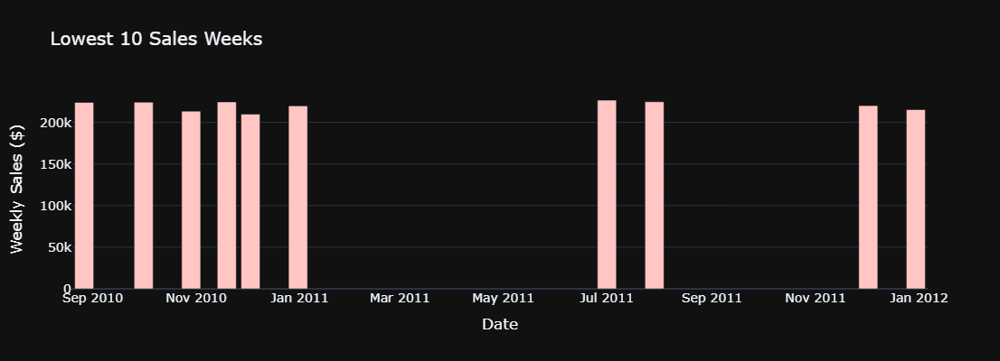

In [326]:
bottom_weeks = df.sort_values("Weekly_Sales").head(10)
fig = px.bar(bottom_weeks, x="Date", y="Weekly_Sales", title="Lowest 10 Sales Weeks", template='plotly_dark',
             color_discrete_sequence=px.colors.sequential.Burg, width=1100, height=400)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Weekly Sales ($)",
    font=dict(size=14)
)

fig.show()

# Trend vs External Factors (Advanced Correlation Analysis)

In [338]:
holiday_corr = df[df['Holiday_Flag']==1][['Weekly_Sales','Fuel_Price','CPI','Unemployment']].corr()
nonholiday_corr = df[df['Holiday_Flag']==0][['Weekly_Sales','Fuel_Price','CPI','Unemployment']].corr()

# Compare side by side
print("Holiday Correlation:\n", holiday_corr)
print("\nNon-Holiday Correlation:\n", nonholiday_corr)

Holiday Correlation:
               Weekly_Sales  Fuel_Price       CPI  Unemployment
Weekly_Sales      1.000000    0.045589 -0.080970     -0.096566
Fuel_Price        0.045589    1.000000 -0.203995     -0.033976
CPI              -0.080970   -0.203995  1.000000     -0.299624
Unemployment     -0.096566   -0.033976 -0.299624      1.000000

Non-Holiday Correlation:
               Weekly_Sales  Fuel_Price       CPI  Unemployment
Weekly_Sales      1.000000    0.009951 -0.071940     -0.107566
Fuel_Price        0.009951    1.000000 -0.169252     -0.033945
CPI              -0.071940   -0.169252  1.000000     -0.302195
Unemployment     -0.107566   -0.033945 -0.302195      1.000000


# Sales Volatility (Week-to-Week Change)

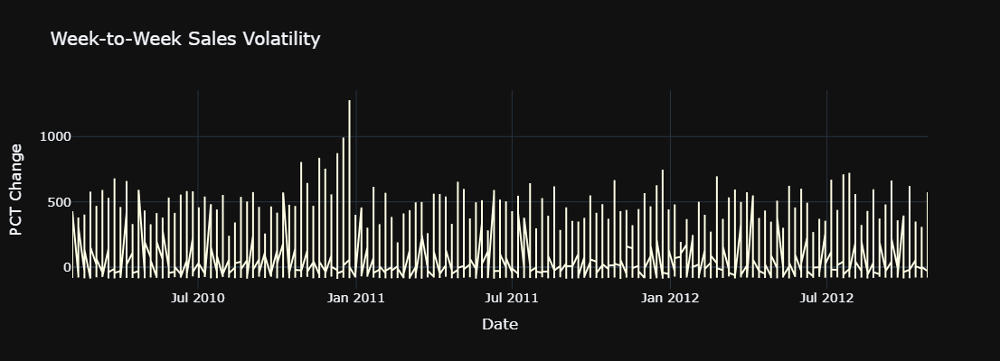

In [349]:
df['pct_change'] = df['Weekly_Sales'].pct_change() * 100
fig = px.line(df, x="Date", y="pct_change", title="Week-to-Week Sales Volatility", template='plotly_dark',
              color_discrete_sequence=px.colors.sequential.YlOrBr, width=1100, height=400)

fig.update_layout(
    xaxis_title="Date",
    yaxis_title="PCT Change",
    font=dict(size=14)
)
fig.show()

# Store Ranking by Stability & Growth

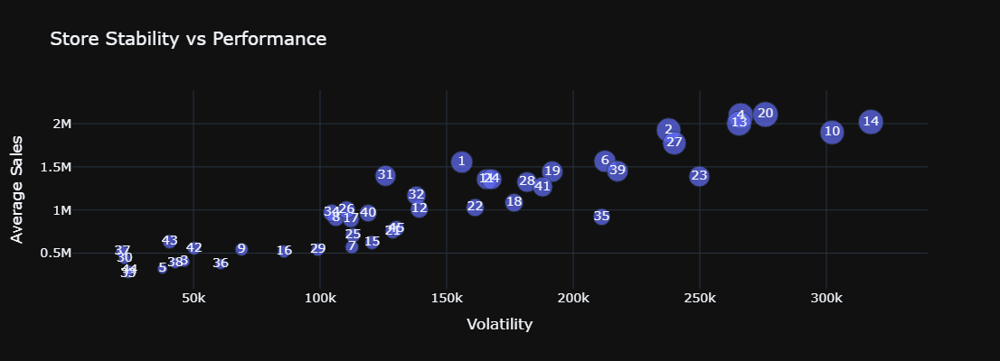

In [356]:
store_stats = df.groupby("Store").agg(
    avg_sales=('Weekly_Sales','mean'),
    volatility=('Weekly_Sales','std'),
    growth=('Weekly_Sales','mean')
).reset_index()

fig = px.scatter(store_stats, x="volatility", y="avg_sales", size="growth", 
                 text="Store", title="Store Stability vs Performance", template='plotly_dark', width=1100, height=400)

fig.update_layout(
    xaxis_title="Volatility",
    yaxis_title="Average Sales",
    font=dict(size=14)
)

fig.show()

# Cumulative Sales Tracking

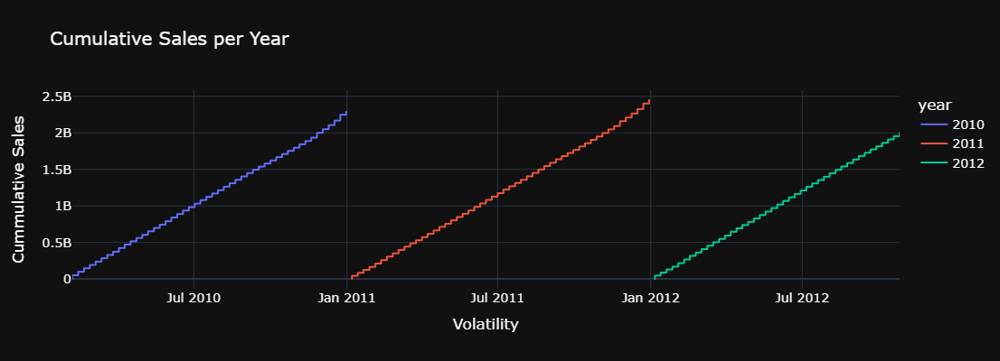

In [361]:
df['cum_sales'] = df.groupby("year")['Weekly_Sales'].cumsum()
fig = px.line(df, x="Date", y="cum_sales", color="year", title="Cumulative Sales per Year", template='plotly_dark',
              width=1100, height=400)

fig.update_layout(
    xaxis_title="Volatility",
    yaxis_title="Cummulative Sales",
    font=dict(size=14)
)

fig.show()

# Training Model

In [27]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Assuming df is your dataset
# Make sure the Date column is datetime
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Date (important for time-series split)
df = df.sort_values(by='Date')

# Define features and target
X = df.drop(columns=['Weekly_Sales', 'Date'])  # Drop target + date
y = df['Weekly_Sales']

# Time-based split: e.g., 80% train, 20% test
train_size = int(len(df) * 0.8)

X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

print("Train shape:", X_train.shape, y_train.shape)
print("Test shape:", X_test.shape, y_test.shape)

Train shape: (5148, 12) (5148,)
Test shape: (1287, 12) (1287,)


In [28]:
X_train.head()

,Store,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week,day,dayofweek,is_weekend
0,1,0,42.31,2.572,211.096358,8.106,2010,2,5,5,4,0
429,4,0,43.76,2.598,126.442065,8.623,2010,2,5,5,4,0
4290,31,0,39.05,2.572,210.752605,8.324,2010,2,5,5,4,0
2145,16,0,19.79,2.580,189.381697,7.039,2010,2,5,5,4,0
1430,11,0,46.04,2.572,214.424881,7.368,2010,2,5,5,4,0


In [31]:
X_test.head()

,Store,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week,day,dayofweek,is_weekend
3260,23,0,41.81,4.025,137.868000,4.125,2012,4,15,13,4,0
4976,35,0,52.22,4.044,141.843393,8.876,2012,4,15,13,4,0
5119,36,0,72.54,3.919,220.195339,6.989,2012,4,15,13,4,0
1830,13,0,51.70,3.833,131.108000,5.965,2012,4,15,13,4,0
2402,17,0,46.94,3.833,131.108000,6.235,2012,4,15,13,4,0


In [33]:
y_test

3260    1231752.54
4976     788633.42
5119     339407.94
1830    2057637.86
2402     877055.32
           ...    
1715     974697.60
4289     439424.50
2144     558473.60
6148     587603.55
6434     760281.43
Name: Weekly_Sales, Length: 1287, dtype: float64

# Model Building

In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [37]:
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=200, random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(n_estimators=200, random_state=42),
    "XGBoost": XGBRegressor(n_estimators=200, learning_rate=0.1, random_state=42, objective="reg:squarederror")
}

In [39]:
models

{'Linear Regression': LinearRegression(),
 'Random Forest': RandomForestRegressor(n_estimators=200, random_state=42),
 'Gradient Boosting': GradientBoostingRegressor(n_estimators=200, random_state=42),
 'XGBoost': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, ...)}

# Model Evaluation

In [41]:
results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    results[name] = {"MAE": mae, "RMSE": rmse, "R2": r2}

In [42]:
results_df = pd.DataFrame(results).T
results_df.head()

,MAE,RMSE,R2
Linear Regression,417462.301030,497566.908167,0.130627
Random Forest,94654.785500,165499.857017,0.903817
Gradient Boosting,100095.870997,132198.177843,0.938630
XGBoost,90722.077887,120511.479750,0.949001


# Feature Importance

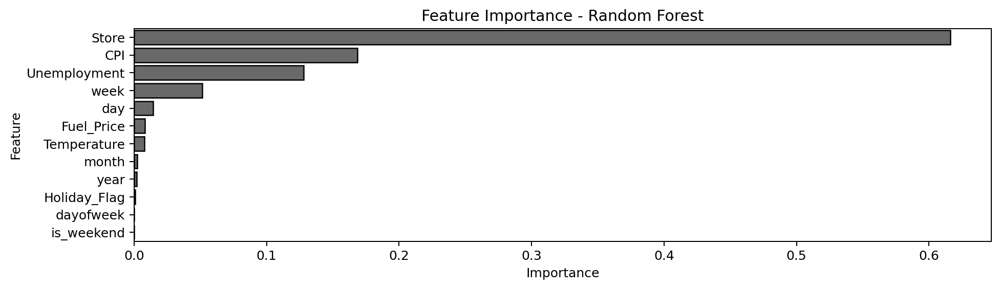

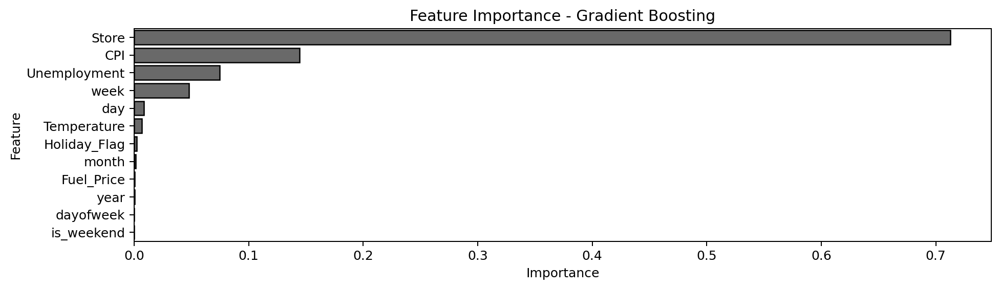

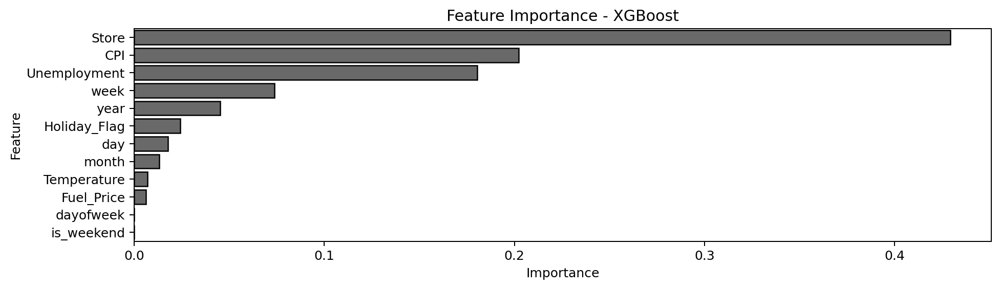

In [104]:
for name, model in models.items():
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        feat_imp = pd.DataFrame({"Feature": X.columns, "Importance": importance})
        feat_imp = feat_imp.sort_values(by="Importance", ascending=False)
        
        plt.figure(figsize=(12,3), dpi=180)
        sns.barplot(x="Importance", y="Feature", data=feat_imp, color='dimgray', edgecolor='k')
        plt.title(f"Feature Importance - {name}")
        plt.show()

# 📊 Insights

Linear Regression → fails (R² = 0.13) → sales patterns are non-linear & seasonal.

Random Forest → much better (R² = 0.90) but not as strong as boosting.

Gradient Boosting → very good (R² = 0.94).

XGBoost → best model (R² = 0.95), lowest errors.

In [51]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

### ===============================
## Train XGBoost Model
### ===============================

### Define the model with good starting params

In [57]:
xgb_model = XGBRegressor(
    n_estimators=500,        # number of boosting rounds
    learning_rate=0.05,      # shrinkage step
    max_depth=8,             # tree depth
    subsample=0.8,           # row sampling
    colsample_bytree=0.8,    # feature sampling
    random_state=42,
    n_jobs=-1,
    objective="reg:squarederror"
)

In [59]:
# Train the model
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=-1, num_parallel_tree=None, ...)

In [61]:
# Predict
y_pred = xgb_model.predict(X_test)

### ===============================
## Evaluation
### ===============================

In [72]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)*100

print("📊 XGBoost Results:")
print(f"MAE : {mae:,.2f}")
print(f"RMSE: {rmse:,.2f}")
print(f"R²  : {r2:.4f}%")

📊 XGBoost Results:
MAE : 73,130.02
RMSE: 95,970.91
R²  : 96.7657%


### ===============================
## Feature Importance Plot
### ===============================

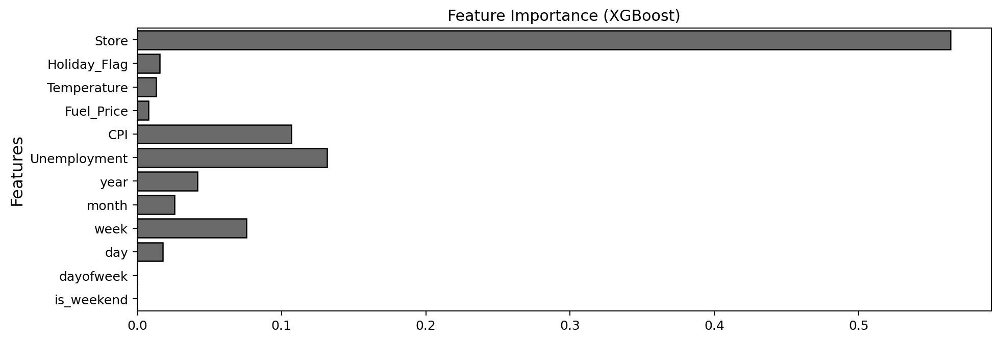

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,4), dpi=180)
sns.barplot(x=xgb_model.feature_importances_, y=X_train.columns, color='dimgrey', edgecolor='k')
plt.title("Feature Importance (XGBoost)")
plt.ylabel("Features", fontsize=13)
plt.show()

In [93]:
import joblib

# After training your model
joblib.dump((model, X_train.columns.tolist()), "retail_sales_xgb.pkl")

['retail_sales_xgb.pkl']

In [108]:
import pandas as pd
import joblib
from datetime import datetime

# Load trained model + feature names
model, feature_names = joblib.load("retail_sales_xgb.pkl")

def prepare_input(
    Store=1,
    Holiday_Flag=0,
    Temperature=70,
    Fuel_Price=4.7,
    CPI=200,
    Unemployment=6.0,
    date="2025-08-24"   # You can pass a date instead of manual year,month,day
):
    # Parse date
    dt = datetime.strptime(date, "%Y-%m-%d")
    
    # Build full input dict with all required features
    input_data = {
        "Store": Store,
        "Holiday_Flag": Holiday_Flag,
        "Temperature": Temperature,
        "Fuel_Price": Fuel_Price,
        "CPI": CPI,
        "Unemployment": Unemployment,
        "year": dt.year,
        "month": dt.month,
        "week": dt.isocalendar()[1],
        "day": dt.day,
        "dayofweek": dt.weekday(),
        "is_weekend": 1 if dt.weekday() >= 5 else 0
    }
    
    # Convert to DataFrame and align with training features
    df = pd.DataFrame([input_data])[feature_names]
    
    return df

def predict_sales(**kwargs):
    df = prepare_input(**kwargs)
    prediction = model.predict(df)
    return prediction[0]

# Example Usage
predicted_sales = predict_sales(Temperature=65, CPI=210, Unemployment=7.2, Holiday_Flag=0, date="2025-08-24")
print(f"Predicted Weekly Sales: {predicted_sales:,.2f}")

Predicted Weekly Sales: 1,491,905.50
